# Ejercicios

1. Descargue 10 segundos de la canción de su preferencia desde youtube, y generé un filtro pasabanda (el usuario debe poder definir las frecuencias de corte) para cada uno de los filtros descritos (el usuario también debe poder fijar los parámetros de diseño de cada filtro). Compare los resultados de los filtros estudiados en este cuaderno tipo IIR para diseño Butterworth, Chebyshev 1, Chebyshev 2, Bessel y Elíptico.

2. Consulte en qué consiste el método de diseño de filtros FIR por ventaneo (Ver función [firwin](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.firwin.html) y [material de apoyo](https://www.programcreek.com/python/example/100540/scipy.signal.firwin)). Realice un cuadro comparativo de las ventajas y desventajas de los filtros IIR y los FIR. Nota: Recuerde que un filtro FIR utiliza solamente raíces tipo ceros, es decir que $a_0=1$, y $a_k=0$ $\forall k\in\{1,2,\dots\}$.

3. Incluya la implementación del filtro `firwin` en el punto 1.

In [14]:
# Audio sobre el que se va a trabajar para este ejemplo.
link="https://youtu.be/YHRvDo8rUoQ?si=fmFDBub0Nav4KlOf"
!yt-dlp --extract-audio -o "audio3" --audio-format mp3 {link}

!ffmpeg -i audio3.mp3 output3.wav

# Nota: Estas líneas requieren que 'soundfile' (sf) esté importado.
# En un entorno de script o notebook, si sf ya está importado en el segundo bloque, funcionará.
# Para ejecución secuencial, se podría mover el 'import sf' aquí.
# Por simplicidad y siguiendo la estructura original, se mantienen las siguientes líneas,
# asumiendo que se ejecutarán en un entorno que ya tiene el audio disponible.
import soundfile as sf
nombre_out = "output3.wav"
x, fs = sf.read(nombre_out)

[youtube] Extracting URL: https://youtu.be/YHRvDo8rUoQ?si=fmFDBub0Nav4KlOf
[youtube] YHRvDo8rUoQ: Downloading webpage
[youtube] YHRvDo8rUoQ: Downloading android sdkless player API JSON
[youtube] YHRvDo8rUoQ: Downloading web safari player API JSON
ERROR: [youtube] YHRvDo8rUoQ: Sign in to confirm you’re not a bot. Use --cookies-from-browser or --cookies for the authentication. See  https://github.com/yt-dlp/yt-dlp/wiki/FAQ#how-do-i-pass-cookies-to-yt-dlp  for how to manually pass cookies. Also see  https://github.com/yt-dlp/yt-dlp/wiki/Extractors#exporting-youtube-cookies  for tips on effectively exporting YouTube cookies
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --ena

Frecuencia de muestreo: 44100 Hz


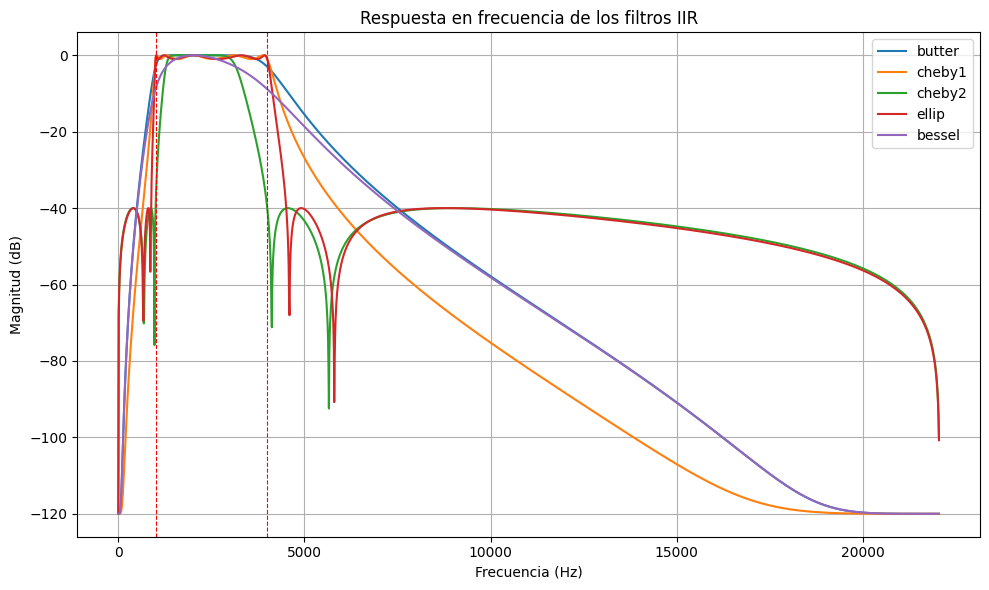

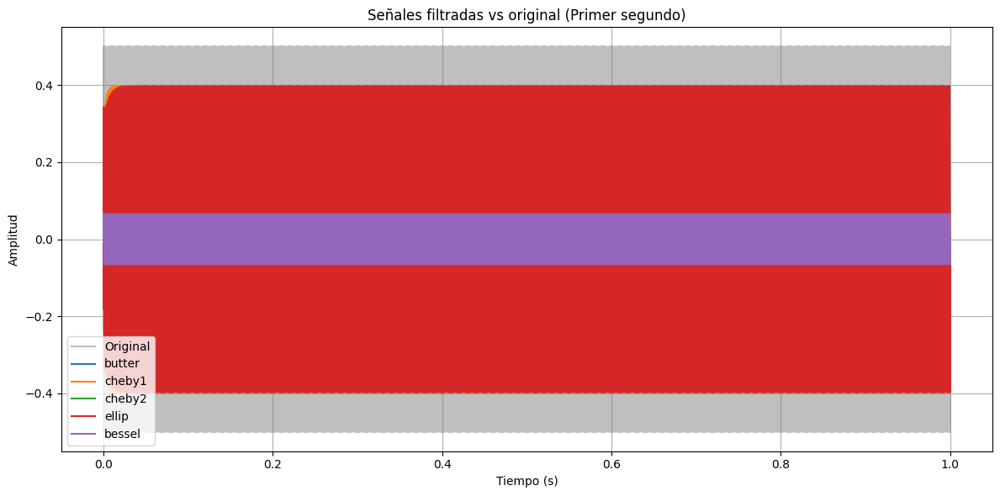

🔊 Audio original (Segmento de 10 segundos):


🔊 Audio filtrado con filtro Butterworth:


🔊 Audio filtrado con filtro Chebyshev Tipo I:


🔊 Audio filtrado con filtro Chebyshev Tipo II:


🔊 Audio filtrado con filtro Elíptico:


🔊 Audio filtrado con filtro Bessel:


In [16]:
# 🔹 Parte 1: Cargar audio desde YouTube (ya descargado y convertido a .wav)
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, cheby1, cheby2, ellip, bessel, sosfiltfilt, sosfreqz
from IPython.display import Audio, display

nombre_out = "output3.wav"
# Es fundamental que el archivo 'output3.wav' exista antes de ejecutar esta línea.
x, fs = sf.read(nombre_out)
print(f"Frecuencia de muestreo: {fs} Hz")

# 🔹 Parte 2: Seleccionar 10 segundos de audio y convertir a mono
ti = 0  # segundo inicial (Adjusted to be within audio bounds)
tf = 10  # segundo final (Adjusted to be within audio bounds)
# Nota: Se añade una comprobación para asegurar que el audio es lo suficientemente largo.
if x.ndim == 2:
    # Caso estéreo
    # Ensure the slice end is not beyond the audio length
    end_sample = min(int(tf * fs), len(x))
    xs = x[int(ti * fs):end_sample, :]
    xmono = np.mean(xs, axis=1)  # convertir estéreo a mono
else:
    # Caso mono
    # Ensure the slice end is not beyond the audio length
    end_sample = min(int(tf * fs), len(x))
    xs = x[int(ti * fs):end_sample]
    xmono = xs

# 🔹 Parte 3: Definir parámetros de usuario
orden = 5           # orden del filtro
f_low = 1000        # Hz - frecuencia de corte inferior
f_high = 4000       # Hz - frecuencia de corte superior
ripple = 1          # dB - ripple en banda pasante (cheby1, ellip)
atten = 40          # dB - atenuación en banda de rechazo (cheby2, ellip)

# 🔹 Parte 4: Función para diseñar y aplicar filtros
def diseñar_filtrar(filtro_tipo, orden, f_low, f_high, fs,
                     ripple=None, atten=None):
    # Normalización de la frecuencia (SciPy utiliza Wn como fracción de Nyquist o Hz si fs se especifica)
    Wn = [f_low, f_high]  # Banda pasante en Hz (dado que fs está especificado)

    if filtro_tipo == "butter":
        sos = butter(orden, Wn, btype='bandpass', output='sos', fs=fs)
    elif filtro_tipo == "cheby1":
        # cheby1 necesita el ripple
        sos = cheby1(orden, ripple, Wn, btype='bandpass', output='sos', fs=fs)
    elif filtro_tipo == "cheby2":
        # cheby2 necesita la atenuación
        sos = cheby2(orden, atten, Wn, btype='bandpass', output='sos', fs=fs)
    elif filtro_tipo == "ellip":
        # ellip necesita ripple y atenuación
        sos = ellip(orden, ripple, atten, Wn, btype='bandpass', output='sos', fs=fs)
    elif filtro_tipo == "bessel":
        # bessel por defecto usa 'phase' para la normalización
        sos = bessel(orden, Wn, btype='bandpass', output='sos', fs=fs, norm='phase')
    else:
        raise ValueError("Filtro no reconocido")

    # sosfiltfilt aplica el filtro sin alterar la fase (cero-fase)
    y = sosfiltfilt(sos, xmono)
    return y, sos

# 🔹 Parte 5: Filtrar con cada tipo y almacenar resultados
resultados = {}
tipos_filtro = ['butter', 'cheby1', 'cheby2', 'ellip', 'bessel']

for tipo in tipos_filtro:
    y, sos = diseñar_filtrar(tipo, orden, f_low, f_high, fs,
                              ripple=ripple, atten=atten)
    resultados[tipo] = {
        'y': y,
        'sos': sos
    }

# 🔹 Parte 6: Comparar respuesta en frecuencia
plt.figure(figsize=(10, 6))
for tipo, info in resultados.items():
    # worN define el número de puntos para la respuesta de frecuencia
    w, h = sosfreqz(info['sos'], worN=2000, fs=fs)
    plt.plot(w, 20 * np.log10(np.abs(h) + 1e-6), label=tipo)

plt.title("Respuesta en frecuencia de los filtros IIR")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Magnitud (dB)")
plt.grid(True)
plt.axvline(f_low, color='r', linestyle='--', linewidth=0.8)
plt.axvline(f_high, color='r', linestyle='--', linewidth=0.8)
plt.legend()
plt.tight_layout()
plt.show()

# 🔹 Parte 7: Comparar en el tiempo
t = np.arange(len(xmono)) / fs
plt.figure(figsize=(12, 6))
# Se muestra solo una porción de la señal para una mejor visualización.
segmento_visual = int(1 * fs) # 1 segundo para visualización
plt.plot(t[:segmento_visual], xmono[:segmento_visual], label='Original', color='gray', alpha=0.5)
for tipo in tipos_filtro:
    plt.plot(t[:segmento_visual], resultados[tipo]['y'][:segmento_visual], label=tipo)
plt.title(f"Señales filtradas vs original (Primer segundo)")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 🔹 Parte 8: Reproducir audios filtrados (uno por uno)
# Nota: La reproducción depende del entorno donde se ejecute (por ejemplo, Jupyter o Google Colab).
print("🔊 Audio original (Segmento de 10 segundos):")
display(Audio(xmono, rate=fs))

print("🔊 Audio filtrado con filtro Butterworth:")
display(Audio(resultados['butter']['y'], rate=fs))

print("🔊 Audio filtrado con filtro Chebyshev Tipo I:")
display(Audio(resultados['cheby1']['y'], rate=fs))

print("🔊 Audio filtrado con filtro Chebyshev Tipo II:")
display(Audio(resultados['cheby2']['y'], rate=fs))

print("🔊 Audio filtrado con filtro Elíptico:")
display(Audio(resultados['ellip']['y'], rate=fs))

print("🔊 Audio filtrado con filtro Bessel:")
display(Audio(resultados['bessel']['y'], rate=fs))


#Punto 2

# Diseño de filtros FIR por ventana

## ¿En qué consiste el método de diseño FIR por ventana?

El método por ventana es una técnica utilizada para diseñar filtros **FIR** (Finite Impulse Response) mediante el recorte de una respuesta ideal (infinita) del filtro utilizando una función ventana que la hace finita y realizable.

El procedimiento general consiste en:

1. Calcular la respuesta al impulso **ideal** del filtro deseado (por ejemplo, un filtro pasa bajos ideal).
2. Multiplicar esa respuesta por una **ventana temporal** (como Hamming, Hanning, Blackman, etc.) para reducir el ripple y hacer el filtro realizable.
3. El resultado es un filtro FIR **estable** y con posibles propiedades como **fase lineal**.

En Python, el diseño se realiza fácilmente con la función [`scipy.signal.firwin`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.firwin.html).

## Recordatorio teórico de los filtros FIR

La ecuación de diferencia de un filtro FIR es:

$$
y[n] = \sum_{k=0}^{M} b_k \cdot x[n - k]
$$

Es decir, solo depende de los valores actuales y pasados de la entrada (no hay retroalimentación). Esto significa que:

- $$a_0 = 1$$
- $$a_k = 0 \quad \forall k \in \{1, 2, \dots\}$$

## Comparación Filtros FIR vs IIR

| Característica              | Filtros FIR                        | Filtros IIR                         |
|----------------------------|------------------------------------|-------------------------------------|
| **Estabilidad**            | Siempre estables                   | Pueden ser inestables               |
| **Fase lineal**            | Pueden tener fase perfectamente lineal | Generalmente no lineales            |
| **Eficiencia computacional** | Requieren más coeficientes         | Requieren menos coeficientes        |
| **Diseño**                 | Más sencillo con `firwin` y ventanas | Más complejo (Butterworth, Chebyshev, etc.) |
| **Precisión en frecuencia**| Más ripple o transición ancha      | Alta precisión                      |
| **Realimentación**         | No usan (solo ceros)               | Usan realimentación (ceros y polos) |
| **Uso común**              | Aplicaciones que requieren fase lineal (audio, comunicaciones) | Aplicaciones donde importa más la eficiencia que la fase |

Frecuencia de muestreo: 48000 Hz


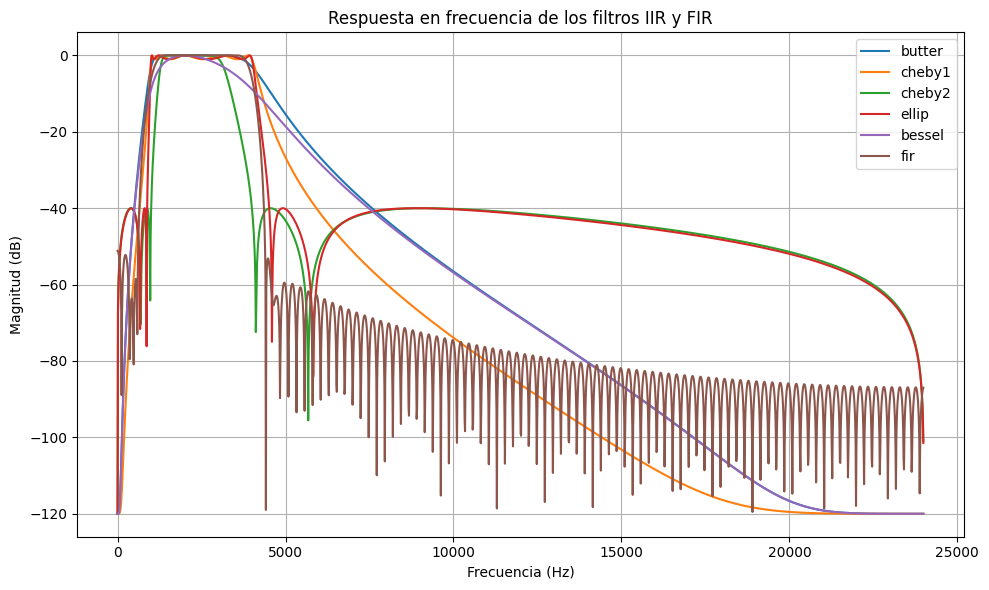

/tmp/ipython-input-41-300570162.py:71: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


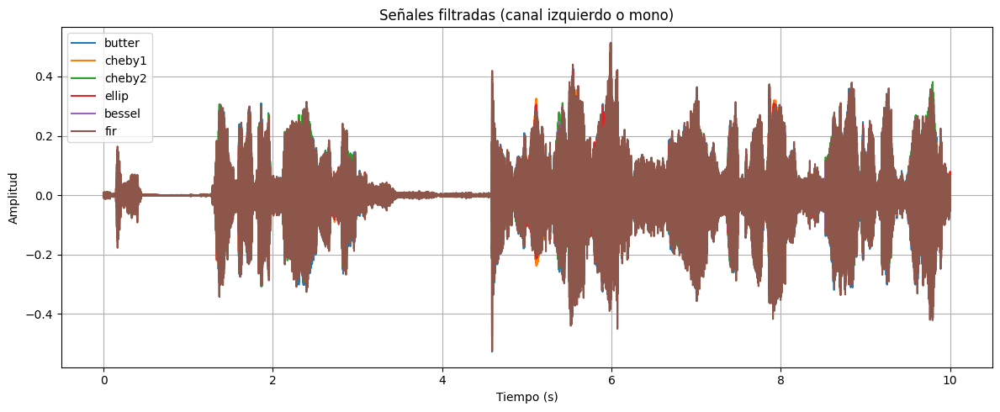

🔊 Audio filtrado con FIR (firwin):


In [ ]:
# 🔹 Parte 0: Cargar el audio descargado y convertirlo
import numpy as np
import soundfile as sf
from scipy.signal import firwin, lfilter, freqz, sosfreqz
import matplotlib.pyplot as plt
from IPython.display import Audio, display

# Leer el archivo de audio completo (estéreo)
nombre_out = "output3.wav"
x, fs = sf.read(nombre_out)
print(f"Frecuencia de muestreo: {fs} Hz")

# 🔹 Parte 1: Seleccionar 10 segundos del audio estéreo
ti = 30  # segundo inicial
tf = 40  # segundo final (10 segundos)
xs = x[int(ti * fs):int(tf * fs), :]  # segmento estéreo
t = np.arange(xs.shape[0]) / fs

# 🔹 Parte 2: Parámetros del filtro FIR
numtaps = 201
f_low = 1000  # Hz
f_high = 4000  # Hz

# 🔹 Parte 3: Diseño del filtro FIR por ventana (Hamming)
fir_coef = firwin(numtaps=numtaps, cutoff=[f_low, f_high], pass_zero=False, fs=fs, window='hamming')

# 🔹 Parte 4: Aplicar filtro FIR a ambos canales
yL_fir = lfilter(fir_coef, 1.0, xs[:, 0])
yR_fir = lfilter(fir_coef, 1.0, xs[:, 1])
y_fir_stereo = np.stack((yL_fir, yR_fir), axis=1)

# 🔹 Parte 5: Guardar resultado FIR en estructura 'resultados'
resultados['fir'] = {
    'y': y_fir_stereo,
    'coef': fir_coef
}

# 🔹 Parte 6: Respuesta en frecuencia de todos los filtros (IIR + FIR)
plt.figure(figsize=(10, 6))
for tipo in tipos_filtro:
    w, h = sosfreqz(resultados[tipo]['sos'], worN=2000, fs=fs)
    plt.plot(w, 20 * np.log10(np.abs(h) + 1e-6), label=tipo)

# Agregar FIR
w_fir, h_fir = freqz(resultados['fir']['coef'], worN=2000, fs=fs)
plt.plot(w_fir, 20 * np.log10(np.abs(h_fir) + 1e-6), label='fir')

plt.title("Respuesta en frecuencia de los filtros IIR y FIR")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Magnitud (dB)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# 🔹 Comparación en el tiempo (canal izquierdo o único canal si es mono)
plt.figure(figsize=(12, 5))

for tipo in tipos_filtro + ['fir']:
    y = resultados[tipo]['y']
    if y.ndim == 1:  # señal mono
        plt.plot(t, y, label=tipo)
    else:  # señal estéreo
        plt.plot(t, y[:, 0], label=tipo)

plt.title("Señales filtradas (canal izquierdo o mono)")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# 🔹 Parte 8: Reproducir el audio FIR estéreo
print("🔊 Audio filtrado con FIR (firwin):")
display(Audio(resultados['fir']['y'].T, rate=fs))
